# Mean Teacher

This method was proposed by Tarvainen et al.. The general approach is similar to Temporal Ensembling but it uses Exponential Moving Average(EMA) of the model parameters instead of predictions.

The key idea is to have two models called “Student” and “Teacher”. The student model is a regular model with dropout. And the teacher model has the same architecture as the student model but its weights are set using an exponential moving average of the weights of student model. For a labeled or unlabeled image, we create two random augmented versions of the image. Then, the student model is used to predict label distribution for first image. And, the teacher model is used to predict the label distribution for the second augmented image. The square difference of these two predictions is used as a consistency loss. For labeled images, we also calculate the cross-entropy loss. The final loss is a weighted sum of these two loss terms. A weight w(t) is applied to decide how much the consistency loss contributes in the overall loss.

In [1]:
import sys
import os
import numpy as np
sys.path.append(os.path.abspath('/projects/renal/srm-detection-main'))

from data.dataloaders import load_segmentation_data
from models.segmentation.semi_supervised import srm_segmentor
from utils import visualize_batch #save_figures_and_show
from evaluation.classification.evaluate import bootstrap_ci


2024-08-22 11:03:20.725438: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-08-22 11:03:20.729860: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-08-22 11:03:20.797922: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


## Load Data

In [2]:
labeled_train_loader, labeled_val_loader = load_segmentation_data("labeled", "srm")
unlabeled_train_loader, unlabeled_val_loader = load_segmentation_data("unlabeled", "srm")

Number of labeled images:
53

Number of labeled segment:
53
training: total labeled image/label: (53) from folder: /projects/renal/DATA_CONFIDENTIAL/structured_data/labeled_train
split: labeled train 43 val 10, folder: /projects/renal/DATA_CONFIDENTIAL/structured_data/labeled_train
Loading Labeled train set - 43 patients



Loading dataset:   0%|          | 0/43 [00:00<?, ?it/s]

Loading dataset: 100%|██████████| 43/43 [02:12<00:00,  3.09s/it]


Loading Labeled validation set - 10 patients



Loading dataset: 100%|██████████| 10/10 [00:18<00:00,  1.88s/it]


Number of unlabeled images:
250
training: total predicted unlabeled image: (250) from folder: /projects/renal/DATA_CONFIDENTIAL/structured_data/unlabeled_train
split: labeled train 201 val 49, folder: /projects/renal/DATA_CONFIDENTIAL/structured_data/unlabeled_train
Loading Unlabeled train set - 201 patients



Loading dataset: 100%|██████████| 201/201 [08:40<00:00,  2.59s/it]


Loading Unlabeled train set - 49 patients



Loading dataset: 100%|██████████| 49/49 [02:05<00:00,  2.55s/it]


## Train SRM Mean Teacher (srmMT) Model - Whole Volume

In [6]:
val_interval, epoch_loss_values, metric_values = srm_segmentor(labeled_train_loader, 
                                                                labeled_val_loader, 
                                                                unlabeled_train_loader,
                                                                model_path="/projects/renal/srm-detection-main/models/weights/segmentation/srm",
                                                                max_epochs=350)

BasicUNet features: (16, 32, 64, 128, 256, 32).
BasicUNet features: (16, 32, 64, 128, 256, 32).
----------
epoch 1/350
1/12, train_loss: 0.6843
2/12, train_loss: 0.6810
3/12, train_loss: 0.6780
4/12, train_loss: 0.6676
5/12, train_loss: 0.6691
6/12, train_loss: 0.6692
7/12, train_loss: 0.6627
8/12, train_loss: 0.6562
9/12, train_loss: 0.6511
10/12, train_loss: 0.6570
11/12, train_loss: 0.6544
12/12, train_loss: 0.6542
13/12, train_loss: 0.6402
epoch 1 average loss: 0.6635
val dice: 0.0100166080519557
saved new best metric model
current epoch: 1 current mean dice: 0.0100
best mean dice: 0.0100 at epoch: 1
epoch time = 28.027868032455444
----------
epoch 2/350
1/12, train_loss: 0.6374
2/12, train_loss: 0.6333
3/12, train_loss: 0.6315
4/12, train_loss: 0.6357
5/12, train_loss: 0.6199
6/12, train_loss: 0.6286
7/12, train_loss: 0.6236
8/12, train_loss: 0.6244
9/12, train_loss: 0.6183
10/12, train_loss: 0.6252
11/12, train_loss: 0.6190
12/12, train_loss: 0.6071
13/12, train_loss: 0.6210
epoc

In [ ]:
# dice_ci_L, dice_ci_U  = bootstrap_ci(metric_values)
# print(f"(AUC) mean ± std (95% CI): {np.mean(metric_values):.3f} ± {np.std(metric_values):.3f} ({dice_ci_L:.3f} - {dice_ci_U:.3f})")
low_ic, up_ic = bootstrap_ci(metric_values)
print(f"(Dice) mean ± std (95% CI): {np.mean(metric_values):.3f} ± {np.std(metric_values):.3f} ({low_ic:.2f},{up_ic:.2f})")


## Train SRM Mean Teacher (srmMT) Model - VOI

### 1. Prepare data loaders

In [3]:
from constants import *

# Concatenate the dataframes
unlabeled_train = pd.DataFrame(UNLABELED_TRAIN_DATA)
#UNLABELED_TEST_DATA, LABELED_TRAIN_DATA, LABELED_TEST_DATA
# sort dataset
tp = ['Renal-CHUS-0010', 'Renal-CHUS-0030', 'Renal-CHUS-0055', 'Renal-CHUS-0070', 'Renal-CHUS-0085', 'Renal-CHUS-0092', 'Renal-CHUS-0104', 'Renal-CHUS-0066', 'Renal-CHUS-0091'] # 66, 91, etc have one kidney
unlabeled_train =  unlabeled_train[~unlabeled_train['root'].isin(tp)] #final_data[final_data['root'] not in tp] # patients 30, 104, 10, 85, 25, 63, 77
unlabeled_train = unlabeled_train.sort_values(by='root')
unlabeled_train.reset_index(drop=True, inplace=True)

print(f"Number of Patients ready for training: {len(unlabeled_train)}")


Number of Patients ready for training: 248


In [4]:
# Concatenate the dataframes
labeled_train = pd.DataFrame(LABELED_TRAIN_DATA)
#UNLABELED_TEST_DATA, LABELED_TRAIN_DATA, LABELED_TEST_DATA
# sort dataset
labeled_train =  labeled_train[~labeled_train['root'].isin(tp)] #final_data[final_data['root'] not in tp] # patients 30, 104, 10, 85, 25, 63, 77
labeled_train = labeled_train.sort_values(by='root')
labeled_train.reset_index(drop=True, inplace=True)

print(f"Number of Patients ready for training: {len(labeled_train)}")

Number of Patients ready for training: 48


In [5]:
# Concatenate the dataframes
unlabeled_test = pd.DataFrame(UNLABELED_TEST_DATA)
#UNLABELED_TEST_DATA, LABELED_TRAIN_DATA, LABELED_TEST_DATA
# sort dataset
unlabeled_test =  unlabeled_test[~unlabeled_test['root'].isin(tp)] #final_data[final_data['root'] not in tp] # patients 30, 104, 10, 85, 25, 63, 77
unlabeled_test = unlabeled_test.sort_values(by='root')
unlabeled_test.reset_index(drop=True, inplace=True)

print(f"Number of Patients ready for training: {len(unlabeled_test)}")

Number of Patients ready for training: 50


In [6]:
# Concatenate the dataframes
labeled_test = pd.DataFrame(LABELED_TEST_DATA)
#UNLABELED_TEST_DATA, LABELED_TRAIN_DATA, LABELED_TEST_DATA
# sort dataset
labeled_test =  labeled_test[~labeled_test['root'].isin(tp)] #final_data[final_data['root'] not in tp] # patients 30, 104, 10, 85, 25, 63, 77
labeled_test = labeled_test.sort_values(by='root')
labeled_test.reset_index(drop=True, inplace=True)

print(f"Number of Patients ready for training: {len(labeled_test)}")

Number of Patients ready for training: 11


### 2. Dataset

In [7]:
import numpy as np
import ast
import torch
from torch.utils.data import Dataset
import monai.transforms as mt
from scipy.ndimage import label, find_objects



class ROIDataset(Dataset):
    def __init__(self, data, q3_x_len=30, q3_y_len=61, q3_z_len=45, transform=None):
        self.data = data
        self.q3_x_len = q3_x_len
        self.q3_y_len = q3_y_len
        self.q3_z_len = q3_z_len
        self.transform = transform

    def __len__(self):
        return len(self.data['root'])

    def get_box_centers(self, box):
        x_start, y_start, z_start, x_len, y_len, z_len = box
        x_center = x_start + x_len // 2
        y_center = y_start + y_len // 2 
        z_center = z_start + z_len // 2 
        return x_center, y_center, z_center

    def crop(self, resized_img, resized_seg, pred, box):
        
        x_start, y_start, z_start, x_len, y_len, z_len = box 

        x_center = x_start+x_len//2
        y_center = y_start+y_len//2
        z_center = z_start+z_len//2

        roi_center = (z_center, y_center, x_center)
        roi_size = (z_len,y_len,x_len)

            
        # Crop the image, seg and prediction to match box area
        cropper = mt.SpatialCrop(roi_center=roi_center, roi_size=roi_size)
        
        
        crop_pred = cropper(pred)
        crop_img = cropper(resized_img)
        crop_seg = cropper(resized_seg)
        crop_depth = crop_pred.shape[3]

        return crop_img, crop_seg, crop_pred, crop_depth


    def load_resized_data(self, data, i):

        # Load image, segmentation, prediction and boxes from data.csvseg_path = data["seg"][i]
        img_path = data['img'][i]
        pred_path = data['pred'][i]
        seg_path = data['seg'][i]
        img_proc = mt.Compose([
                mt.LoadImage(image_only=True, ensure_channel_first=True),
                mt.EnsureType(), 
                mt.Orientation(axcodes='LPS'),
                mt.Spacing(pixdim=(2.0, 2.0, 5.0), mode=("nearest")), 
                mt.ScaleIntensityRange(a_min=-500.0, a_max=500.0, b_min=0.0, b_max=1.0, clip=True),
                mt.ToTensor()
                ])
        
        seg_proc = mt.Compose([
                mt.LoadImage(image_only=True, ensure_channel_first=True),
                mt.EnsureType(), 
                mt.Orientation(axcodes='LPS'),
                mt.Spacing(pixdim=(2.0, 2.0, 5.0), mode=("nearest")), 
                mt.ToTensor()
                ])

        pred_proc = mt.Compose([
                    mt.LoadImage(image_only=True, ensure_channel_first=True, simple_keys=True),
                    mt.Orientation(axcodes='LPS'),
                    mt.LabelToContour(),
                    mt.KeepLargestConnectedComponent(is_onehot=False, independent=True, connectivity=3, num_components=2),
                    mt.FillHoles(applied_labels=[1,2], connectivity=3),
                    mt.ToTensor()
                    ])

        
        seg = seg_proc(seg_path)
        img = img_proc(img_path)
        pred = pred_proc(pred_path)

        # sitk : D H W    monai : W H D
        x = pred.shape[1]
        y = pred.shape[2]
        z = pred.shape[3]

        # Resize image and segmentation so they match prediction in shape
        resize_transform_seg = mt.Resize(spatial_size=(x, y, z), mode="nearest")
        resize_transform_img = mt.Resize(spatial_size=(x, y, z))
        resized_img = resize_transform_img(img)
        resized_seg = resize_transform_seg(seg)


        return resized_img, resized_seg, pred
    
    def resize_before_train(self, img, seg):


        resize_transform_seg = mt.Resize(spatial_size=(64, 64, 32), mode="nearest")
        resize_transform_img = mt.Resize(spatial_size=(64, 64, 32))
        resized_img = resize_transform_img(img)
        resized_seg = resize_transform_seg(seg)
        

        return resized_img, resized_seg
    
        # Define the checker function
        

    def checker(self, crop_seg):
        """
        Check if the crop_seg contains a tumor.
        
        Parameters:
        crop_seg (numpy array): The cropped segmentation mask.
        box (tuple): The bounding box coordinates (x, y, z, x_len, y_len, z_len).
        
        Returns:
        int: 1 if the crop_seg contains a tumor, 0 otherwise.
        """
        # Assuming the tumor label is 1
        
        tumor_label = 0.5
        return 1 if np.any(crop_seg > tumor_label) else 0
        

    def retrieve_kidney_boxes(self, boxes):
        
        kidney_boxes = []
        for box in boxes:
            x_start, y_start, z_start, x_len, y_len, z_len = box 
            volume = x_len * y_len * z_len
            kidney_boxes.append((x_start, y_start, z_start, x_len, y_len, z_len, volume))
        kidney_boxes = sorted(kidney_boxes, key=lambda x: x[6], reverse=True)[:2]
        kidney_boxes = [(x_start, y_start, z_start, x_len, y_len, z_len) for x_start, y_start, z_start, x_len, y_len, z_len, _ in kidney_boxes]
        return kidney_boxes
    
    # Function to calculate bounding boxes from binary masks
    def bounding_box(self, mask):
        mask_np = mask.squeeze().cpu().numpy()  # Convert tensor to numpy array
        labeled, num_features = label(mask_np)  # Label connected components
        objects = find_objects(labeled)  # Find bounding boxes for each connected component

        boxes = []
        for obj in objects:
            z_start, z_end = obj[0].start, obj[0].stop
            y_start, y_end = obj[1].start, obj[1].stop
            x_start, x_end = obj[2].start, obj[2].stop
            x_len = x_end - x_start
            y_len = y_end - y_start
            z_len = z_end - z_start
            volume = x_len * y_len * z_len
            boxes.append((x_start, y_start, z_start, x_len, y_len, z_len, volume))
        
        # Sort boxes by volume in descending order and take the two largest
        boxes = sorted(boxes, key=lambda x: x[6], reverse=True)[:2]
        
        # Remove the volume information from the output
        boxes = [(x_start, y_start, z_start, x_len, y_len, z_len) for x_start, y_start, z_start, x_len, y_len, z_len, _ in boxes]
        
        return boxes


    def __getitem__(self, idx):
        
        patient_id = self.data['root'][idx]

        resized_img, resized_seg, pred = self.load_resized_data(self.data, idx)
        kidney_boxes = self.bounding_box(pred)

        r_box= kidney_boxes[0]
        l_box= kidney_boxes[1]

        l_crop_img, l_crop_seg, l_crop_pred, _ = self.crop(resized_img, resized_seg, pred, l_box)
        r_crop_img, r_crop_seg, r_crop_pred, _ = self.crop(resized_img, resized_seg, pred, r_box)
                            

        # select the kidney image and segment that contain tumor, ignore the other
        if self.checker(r_crop_seg) == 1:  # right contains tumor
            if self.transform:
                r_crop_img = self.transform[0](r_crop_img)
                r_crop_seg = self.transform[1](r_crop_seg)

            img, seg = self.resize_before_train(r_crop_img, r_crop_seg)
   

        else: # self.checker(l_crop_seg) == 1:  # left contains tumor
                if self.transform:
                    l_crop_img = self.transform[0](l_crop_img)
                    l_crop_seg = self.transform[1](l_crop_seg)
            
                img, seg = self.resize_before_train(l_crop_img, l_crop_seg)


        batch = {
            'Patient_ID': patient_id,
            'img': img,
            'seg': seg,
        }

        return batch
        

### 3. Transforms

In [8]:
import monai.transforms as mt

from monai.transforms import (
    Compose,
    RandAffine,
    RandFlip,
    Spacing,
    MapLabelValue,
)


# %% transforms: different for train, validation and inference
def get_srm_transforms(mode="unlabeled_train", key="img"):  # This is a modified version that contains the transforms for prediction samples

    if key == "img":
        xforms = []
        
        if mode == "labeled_train":
            
            xforms.extend(
                [
                    RandAffine(
                        prob=0.15,
                        rotate_range=(0.05, 0.05, None),  # 3 parameters control the transform on 3 dimensions
                        scale_range=(0.1, 0.1, None),
                        mode=("bilinear")
                    ),
                    RandFlip(spatial_axis=0, prob=0.5),
                    RandFlip(spatial_axis=1, prob=0.5),
                    RandFlip(spatial_axis=2, prob=0.5),
                ]
            )
            dtype = (np.float32)
        if mode == "val":
            dtype = (np.float32, np.uint8)
        if mode == "holdout":
            dtype = (np.float32,)
        if mode == "unlabeled_train":
            xforms.extend(
                [
                    RandAffine(
                        prob=0.15,
                        rotate_range=(0.05, 0.05, None),  # 3 parameters control the transform on 3 dimensions
                        scale_range=(0.1, 0.1, None),
                        mode=("bilinear")
                    ),
                    RandFlip(spatial_axis=0, prob=0.5),
                    RandFlip(spatial_axis=1, prob=0.5),
                    RandFlip(spatial_axis=2, prob=0.5),
                ]
            )
            dtype = (np.float32, np.uint8)

    else:
        xforms = [

            Spacing(pixdim=(2.0, 2.0, 5.0), mode=("nearest")), #8 or 5 instead of 10.0
            MapLabelValue(
                        orig_labels=np.array([1, 2, 3, 4]),
                        target_labels=np.array([1, 1, 1, 1])),

            ]
    
        if mode == "labeled_train":
            
            xforms.extend(
                [
                    RandAffine(
                        prob=0.15,
                        rotate_range=(0.05, 0.05, None),  # 3 parameters control the transform on 3 dimensions
                        scale_range=(0.1, 0.1, None),
                        mode=("nearest")
                    ),
                    RandFlip(spatial_axis=0, prob=0.5),
                    RandFlip(spatial_axis=1, prob=0.5),
                    RandFlip(spatial_axis=2, prob=0.5),
                ]
            )
            dtype = (np.uint8)
        if mode == "val":
            dtype = (np.uint8)
        if mode == "unlabeled_train":
            xforms.extend(
                [
                    RandAffine(
                        prob=0.15,
                        rotate_range=(0.05, 0.05, None),  # 3 parameters control the transform on 3 dimensions
                        scale_range=(0.1, 0.1, None),
                        mode=("nearest")
                    ),
                    RandFlip(spatial_axis=0, prob=0.5),
                    RandFlip(spatial_axis=1, prob=0.5),
                    RandFlip(spatial_axis=2, prob=0.5),
                ]
            )
            dtype = (np.uint8)
    # xforms.extend([CastToTyped(keys, dtype=dtype), EnsureTyped(keys)])
    return Compose(xforms)


### 4. Loaders

In [3]:
from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

import monai
from monai.data import pad_list_data_collate

from utils import *
from constants import *
from data.transforms import  InfiniteSampler


keys = ("img", "seg")
train_frac, val_frac = 0.8, 0.2


# dataloader - for unlabeled cases
n_train = int(train_frac * len(labeled_train['root'])) + 1
n_val = min(len(labeled_train['root']) - n_train, int(val_frac * len(labeled_train['root'])))
print(f"split: labeled train {n_train} val {n_val}, folder: {LABELED_DATA_PATH}")

train_files = [{keys[0]: img, keys[1]: seg} for img, seg in zip(labeled_train['img'][:n_train], labeled_train['seg'][:n_train])]
val_files = [{keys[0]: img, keys[1]: seg} for img, seg in zip(labeled_train['img'][-n_val:], labeled_train['seg'][-n_val:])]

# create a training data loader for labeled data

print(f"Loading Labeled train set - {len(train_files)} patients\n")
labeled_train_transforms_img = get_srm_transforms("labeled_train", key=(keys[0]))
labeled_train_transforms_seg = get_srm_transforms("labeled_train", key=(keys[1]))
train_ds = ROIDataset(labeled_train, transform=[labeled_train_transforms_img, labeled_train_transforms_seg])
labeled_sampler = InfiniteSampler(list_indices=list(range(len(train_files))), batch_size=16)
labeled_train_loader = monai.data.DataLoader(
    train_ds,
    num_workers=4,
    pin_memory=torch.cuda.is_available(),
    batch_sampler=labeled_sampler
)

# create a validation data loader for labeled data

print(f"Loading Labeled validation set - {len(val_files)} patients\n")
val_transforms_img = get_srm_transforms("val", key=(keys[0]))
val_transforms_seg = get_srm_transforms("val", key=(keys[1]))

val_ds = ROIDataset(labeled_test, transform=[val_transforms_img, val_transforms_seg])

labeled_val_loader = monai.data.DataLoader(
    val_ds,
    batch_size=4,  # image-level batch to the sliding window method, not the window-level batch
    num_workers=4,
    pin_memory=torch.cuda.is_available(),
    collate_fn=pad_list_data_collate,
)

 
# dataloader - for unlabeled cases
n_train_unlabeled = int(train_frac * len(unlabeled_train['root'])) + 1
n_val_unlabeled = min(len(unlabeled_train['root']) - n_train_unlabeled, int(val_frac * len(unlabeled_train['root'])))
print(f"split: labeled train {n_train_unlabeled} val {n_val_unlabeled}, folder: {UNLABELED_DATA_PATH}")

unlabeled_train_files = [{keys[0]: img, keys[1]: seg} for img, seg in zip(unlabeled_train['img'][:n_train_unlabeled], unlabeled_train['seg'][:n_train_unlabeled])]
unlabeled_val_files = [{keys[0]: img, keys[1]: seg} for img, seg in zip(unlabeled_train['img'][-n_val_unlabeled:], unlabeled_train['seg'][-n_val_unlabeled:])]


# create a training data loader for unlabeled data
print(f"Loading Unlabeled train set - {len(unlabeled_train_files)} patients\n")
unlabeled_train_transforms_img = get_srm_transforms("unlabeled_train", key=(keys[0]))
unlabeled_train_transforms_seg = get_srm_transforms("unlabeled_train", key=(keys[1]))

unlabeled_train_ds = ROIDataset(unlabeled_train, transform=[unlabeled_train_transforms_img, unlabeled_train_transforms_seg])

unlabeled_train_loader = monai.data.DataLoader(
    unlabeled_train_ds,
    batch_size=16,
    shuffle=True,
    num_workers=4,
    pin_memory=torch.cuda.is_available(),
    collate_fn=pad_list_data_collate,
)

# create a validation data loader for unlabeled data
print(f"Loading Unlabeled train set - {len(unlabeled_val_files)} patients\n")

val_unlabeled_transforms_img = get_srm_transforms(mode="val", key=(keys[0]))
val_unlabeled_transforms_seg = get_srm_transforms(mode="val", key=(keys[1]))

val_unlabeled_ds = ROIDataset(unlabeled_test, transform=[val_unlabeled_transforms_img, val_unlabeled_transforms_seg])
unlabeled_val_loader = monai.data.DataLoader(
    val_unlabeled_ds,
    batch_size=4,  # image-level batch to the sliding window method, not the window-level batch
    num_workers=4,
    collate_fn=pad_list_data_collate,
    pin_memory=torch.cuda.is_available(),
)


NameError: name 'labeled_train' is not defined

### 5. Visualization

In [20]:
def visualize_srm_batch(batch, image_only=True, style='viridis'):
    images = batch['img']
    ids = batch['Patient_ID']
    batch_size = len(images)

    if image_only:
        if batch_size == 1:
            fig, ax = plt.subplots(figsize=(24, 16))
            ax.imshow(images[0].numpy()[0, :, :, 15], cmap=style)
            ax.axis('off')
        else:
            fig, axes = plt.subplots(nrows=1, ncols=batch_size, figsize=(24, 16))
            for i in range(batch_size):
                image = images[i].numpy()
                axes[i].imshow(image[0, :, :, 15], cmap=style)
                axes[i].axis('off')
    else:
        masks = batch['seg']
        if batch_size == 1:
            fig, (ax_img, ax_mask) = plt.subplots(nrows=2, ncols=1, figsize=(24, 16))
            ax_img.imshow(images[0].numpy()[0, :, :, 15], cmap='gray')
            ax_img.axis('off')
            ax_mask.imshow(masks[0].numpy()[0, :, :, 15], cmap='gray')
            ax_mask.set_title(f"Mask {ids[0][-4:]}")
            ax_mask.axis('off')
        else:
            fig, axes = plt.subplots(nrows=2, ncols=batch_size, figsize=(24, 16))
            for i in range(batch_size):
                image = images[i].numpy()
                mask = masks[i].numpy()
                axes[0, i].imshow(image[0, :, :, 15], cmap='gray')
                axes[0, i].axis('off')
                axes[1, i].imshow(mask[0, :, :, 15], cmap='gray')
                axes[1, i].set_title(f"Mask {ids[i][-4:]}")
                axes[1, i].axis('off')

    plt.tight_layout()
    plt.show()


### Masks before binarization (contain non binary values)

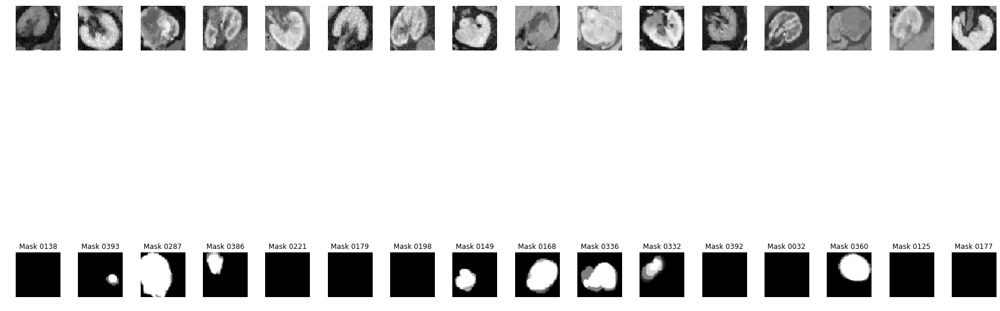

In [18]:
for batch in unlabeled_train_loader:
    visualize_srm_batch(batch, image_only = False, style='gray')
    break 


### Masks after binarization (contain binary values)

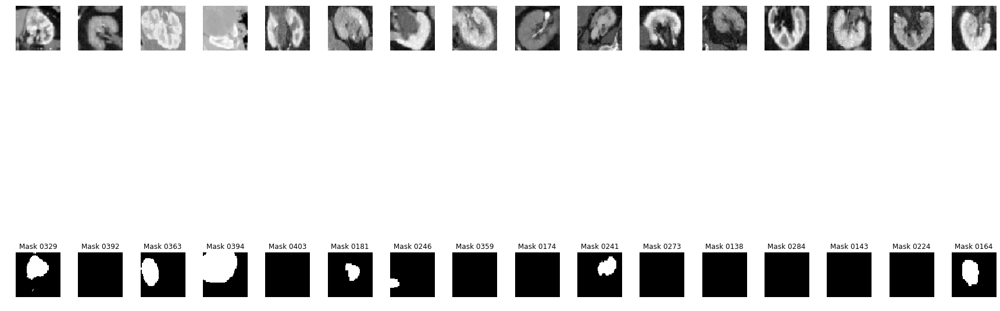

In [54]:
for batch in unlabeled_train_loader:
    visualize_srm_batch(batch, image_only = False, style='gray')
    break  


### 6. Check masks values

In [55]:
def check_mask_values(batch):
    ids = batch['Patient_ID']
    masks = batch['seg']
    batch_size = len(masks)

    if batch_size == 1:
        mask = masks[0].numpy()
        unique_values = np.unique(mask)
        print(f"Unique label values for {ids[0]}: {unique_values}")

    else:
        for i in range(batch_size):
            mask = masks[i].numpy()
            
            unique_values = np.unique(mask)
            print(f"Unique label values for {ids[i]}: {unique_values}")



In [59]:
for batch in unlabeled_train_loader:
    visualize_srm_batch(batch, image_only = False, style='gray')
    break

Unique label values for Renal-CHUS-0220: [0. 1.]
Unique label values for Renal-CHUS-0274: [0. 1.]
Unique label values for Renal-CHUS-0284: [0. 1.]
Unique label values for Renal-CHUS-0399: [0. 1.]
Unique label values for Renal-CHUS-0368: [0. 1.]
Unique label values for Renal-CHUS-0354: [0. 1.]
Unique label values for Renal-CHUS-0227: [0. 1.]
Unique label values for Renal-CHUS-0088: [0. 1.]
Unique label values for Renal-CHUS-0371: [0. 1.]
Unique label values for Renal-CHUS-0159: [0. 1.]
Unique label values for Renal-CHUS-0189: [0. 1.]
Unique label values for Renal-CHUS-0229: [0. 1.]
Unique label values for Renal-CHUS-0201: [0. 1.]
Unique label values for Renal-CHUS-0202: [0. 1.]
Unique label values for Renal-CHUS-0027: [0.]
Unique label values for Renal-CHUS-0194: [0. 1.]


### 7. save cropped data

In [ ]:
import nrrd
import os

predictions_dir = "/projects/renal/srm-detection-main/outputs/segmentation/save_cropped_data"
for batch in unlabeled_val_loader:
    image = batch["img"].cpu().numpy()
    seg = batch["seg"].cpu().numpy()
    patient_id = batch["Patient_ID"][0]

    # Create a directory for the current patient
    patient_dir = os.path.join(predictions_dir, str(patient_id))
    os.makedirs(patient_dir, exist_ok=True)

    # Define file paths for image and segmentation
    image_filename = os.path.join(patient_dir, f'cropped_image_{patient_id}.nrrd')
    seg_filename = os.path.join(patient_dir, f'cropped_image_{patient_id}.seg.nrrd')

    # Save the image and segmentation
    nrrd.write(image_filename, image)
    nrrd.write(seg_filename, seg)
    
    print(f'Patient {patient_id} data saved in {patient_dir}!')


### 8. Load cropped data from files

In [4]:
import nrrd
import os

def load_cropped_data(predictions_dir):
    cropped_data = {
        "Patient_ID": [],
        "img": [],
        "seg": []
    }
    
    # List all patient directories
    patient_dirs = [d for d in os.listdir(predictions_dir) if os.path.isdir(os.path.join(predictions_dir, d))]
    
    for patient_id in patient_dirs:
        patient_dir = os.path.join(predictions_dir, patient_id)
        
        # Define file paths for image and segmentation
        image_filename = os.path.join(patient_dir, f'cropped_image_{patient_id}.nrrd')
        seg_filename = os.path.join(patient_dir, f'cropped_image_{patient_id}.seg.nrrd')
        
        # Read the image and segmentation files
        image, _ = nrrd.read(image_filename)
        seg, _ = nrrd.read(seg_filename)
        
        # Append data to the lists in the dictionary
        cropped_data["Patient_ID"].append(patient_id)
        cropped_data["img"].append(image)
        cropped_data["seg"].append(seg)
    
    return cropped_data

# Usage
predictions_dir = "/projects/renal/srm-detection-main/outputs/segmentation/save_cropped_data"
cropped_data = load_cropped_data(predictions_dir)


### 9. Train FS UNET on VOI [5 Fold CV]

In [5]:
# for fully supervised training, we only need a training set (val included) and test set 
from monai.data import pad_list_data_collate

n_total = len(cropped_data['Patient_ID'])

n_train = int(train_frac * n_total)
n_test = n_total - n_train   # The remaining samples go to the test set

print(f"split: train {n_train}, test {n_test}, folder")

# Split the data
train_files = [{keys[0]: img, keys[1]: seg} for img, seg in zip(cropped_data['img'][:n_train], cropped_data['seg'][:n_train])]
test_files = [{keys[0]: img, keys[1]: seg} for img, seg in zip(cropped_data['img'][-n_test:], cropped_data['seg'][-n_test:])]
# create a training data loader for labeled data

print(f"Loading train set - {len(train_files)} patients\n")
train_ds = monai.data.CacheDataset(train_files)
train_loader = monai.data.DataLoader(
    train_ds,
    batch_size=16,
    num_workers=4,
    pin_memory=torch.cuda.is_available()
)


print(f"Loading test set - {len(test_files)} patients\n")

test_ds = monai.data.CacheDataset(test_files)

test_loader = monai.data.DataLoader(
    test_ds,
    batch_size=4,  # image-level batch to the sliding window method, not the window-level batch
    num_workers=4,
    pin_memory=torch.cuda.is_available(),
    collate_fn=pad_list_data_collate,
)

split: train 278, test 70, folder
Loading train set - 278 patients



Loading dataset:   0%|          | 0/278 [00:00<?, ?it/s]

Loading dataset: 100%|██████████| 278/278 [00:00<00:00, 747.93it/s]


Loading test set - 70 patients



Loading dataset: 100%|██████████| 70/70 [00:00<00:00, 662.77it/s]


In [ ]:
from monai.networks.nets import UNet
from monai.losses import DiceLoss
from monai.metrics import DiceMetric
from monai.inferers import sliding_window_inference
from monai.data import decollate_batch
from monai.transforms import Compose, EnsureType, AsDiscrete
import torch
import torch.optim as optim
from torch.optim.lr_scheduler import StepLR
from torch.utils.data import DataLoader, Subset
from torch.utils.tensorboard import SummaryWriter
from sklearn.model_selection import KFold

# Define data transforms
post_pred = Compose([EnsureType(), AsDiscrete(argmax=True, to_onehot=2)])
post_label = Compose([EnsureType(), AsDiscrete(to_onehot=2)])

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

# Hyperparameters
max_epochs = 50
val_interval = 1

n_splits = 5
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

# Initialize the logger
writer = SummaryWriter()

# Cross-validation loop
best_metric_overall = -1
best_model_path = "/projects/renal/srm-detection-main/models/weights/segmentation/srm/best_fully_supervised_unet_srm_model.pth"

for fold, (train_idx, val_idx) in enumerate(kf.split(range(len(train_ds)))):
    print(f"Fold {fold + 1}/{n_splits}")
    
    # Create data loaders for this fold
    train_subset = Subset(train_ds, train_idx)
    val_subset = Subset(train_ds, val_idx)
    
    train_loader = DataLoader(train_subset, batch_size=16, shuffle=True, num_workers=4)
    val_loader = DataLoader(val_subset, batch_size=4, shuffle=False, num_workers=4)
    
    # Model and optimizer
    model = monai.networks.nets.BasicUNet(
        spatial_dims=3,
        in_channels=1,
        out_channels=2,
        features=(16, 32, 64, 128, 32, 16),  # Adjust as needed
        dropout=0.5,
    ).to(device)

    loss_function = DiceLoss(to_onehot_y=True, softmax=True)
    optimizer = optim.Adam(model.parameters(), lr=1e-4)
    scheduler = StepLR(optimizer, step_size=5, gamma=0.5)
    dice_metric = DiceMetric(include_background=False, reduction="mean")
    
    # Training loop for this fold
    for epoch in range(max_epochs):
        print("-" * 10)
        print(f"Epoch {epoch + 1}/{max_epochs}")
        model.train()
        epoch_loss = 0
        step = 0
        for batch_data in train_loader:
            step += 1
            inputs, labels = batch_data["img"].to(device), batch_data["seg"].to(device)
            inputs = inputs.squeeze(1)
            labels = labels.squeeze(1)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = loss_function(outputs, labels)
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()
            epoch_len = len(train_loader)
            print(f"{step}/{epoch_len}, train_loss: {loss.item():.4f}")
            writer.add_scalar(f"train_loss_fold_{fold + 1}", loss.item(), epoch_len * epoch + step)
        epoch_loss /= step
        print(f"Epoch {epoch + 1} average loss: {epoch_loss:.4f}")

        # Validation
        if (epoch + 1) % val_interval == 0:
            model.eval()
            with torch.no_grad():
                val_loss = 0
                for val_data in val_loader:
                    val_images, val_labels = val_data["img"].to(device), val_data["seg"].to(device)
                    val_images = val_images.squeeze(1)
                    val_labels = val_labels.squeeze(1)
                    val_outputs = model(val_images)
                    val_loss += loss_function(val_outputs, val_labels).item()
                    val_outputs = decollate_batch(val_outputs)
                    val_labels = decollate_batch(val_labels)
                    val_outputs = [post_pred(i) for i in val_outputs]
                    val_labels = [post_label(i) for i in val_labels]
                    dice_metric(y_pred=val_outputs, y=val_labels)
                val_loss /= len(val_loader)
                metric = dice_metric.aggregate().item()
                dice_metric.reset()
                print(f"Epoch {epoch + 1} validation loss: {val_loss:.4f}, validation dice: {metric:.4f}")
                writer.add_scalar(f"val_loss_fold_{fold + 1}", val_loss, epoch + 1)
                writer.add_scalar(f"val_dice_fold_{fold + 1}", metric, epoch + 1)

                if metric > best_metric_overall:
                    best_metric_overall = metric
                    torch.save(model.state_dict(), best_model_path)
                    print(f"Saved new best metric model for fold {fold + 1}")

        scheduler.step()

    print(f"Fold {fold + 1} completed, best_metric: {best_metric_overall:.4f}")

writer.close()
print(f"Training completed. Best overall metric: {best_metric_overall:.4f}")


### 10. Train SS MT on VOI

In [32]:
import monai, torch
from monai.data import CacheDataset, DataLoader
from sklearn.model_selection import train_test_split
from data.transforms import InfiniteSampler

keys = ("img", "seg")
# Define fractions for train, validation, and test splits
train_frac, val_frac = 0.8, 0.2

# Total number of cases
n_total = len(cropped_data['Patient_ID'])

# Calculate the number of training and test samples
n_train = int(train_frac * n_total)
n_test = n_total - n_train  # The remaining samples go to the test set

# Split the data into training and test sets
train_indices, test_indices = train_test_split(range(n_total), test_size=n_test, random_state=42)

# Further split the training data into labeled train and validation sets
labeled_train_indices, labeled_val_indices = train_test_split(train_indices, test_size=val_frac, random_state=42)

# Create the datasets
# Assuming `keys` is a list or tuple with the first element as the image key and the second as the segmentation key
unlabeled_train_files = [{keys[0]: cropped_data['img'][i], keys[1]: cropped_data['seg'][i]} for i in labeled_train_indices[:50]]
labeled_train_files = [{keys[0]: cropped_data['img'][i], keys[1]: cropped_data['seg'][i]} for i in labeled_train_indices[50:]]
labeled_val_files = [{keys[0]: cropped_data['img'][i], keys[1]: cropped_data['seg'][i]} for i in labeled_val_indices]
test_files = [{keys[0]: cropped_data['img'][i], keys[1]: cropped_data['seg'][i]} for i in test_indices]

# Create a training data loader for unlabeled data
print(f"Loading unlabeled train set - {len(unlabeled_train_files)} patients\n")
unlabeled_train_ds = CacheDataset(unlabeled_train_files)
unlabeled_train_loader = DataLoader(
    unlabeled_train_ds,
    batch_size=16,  # Adjust batch size as needed
    num_workers=4,
    pin_memory=torch.cuda.is_available(),
    shuffle=True  # Typically shuffle training data
)

# Create a training data loader for labeled data
print(f"Loading labeled train set - {len(labeled_train_files)} patients\n")
labeled_train_ds = CacheDataset(labeled_train_files)
labeled_sampler = InfiniteSampler(list_indices=list(range(len(labeled_train_files))), batch_size=8)
labeled_train_loader = DataLoader(
    labeled_train_ds,
    num_workers=4,
    pin_memory=torch.cuda.is_available(),
    batch_sampler=labeled_sampler
)

# Create a validation data loader for labeled data
print(f"Loading validation set - {len(labeled_val_files)} patients\n")
labeled_val_ds = CacheDataset(labeled_val_files)
labeled_val_loader = DataLoader(
    labeled_val_ds,
    batch_size=4,
    num_workers=4,
    pin_memory=torch.cuda.is_available(),
    collate_fn=monai.data.pad_list_data_collate,
    shuffle=False  # Do not shuffle validation data
)

# Create a test data loader
print(f"Loading test set - {len(test_files)} patients\n")
test_ds = CacheDataset(test_files)
test_loader = DataLoader(
    test_ds,
    batch_size=4,
    num_workers=4,
    pin_memory=torch.cuda.is_available(),
    collate_fn=monai.data.pad_list_data_collate,
    shuffle=False  # Do not shuffle test data
)


Loading unlabeled train set - 111 patients



Loading dataset: 100%|██████████| 111/111 [00:00<00:00, 770.76it/s]


Loading labeled train set - 111 patients



Loading dataset: 100%|██████████| 111/111 [00:00<00:00, 735.66it/s]


Loading validation set - 56 patients



Loading dataset: 100%|██████████| 56/56 [00:00<00:00, 686.13it/s]


Loading test set - 70 patients



Loading dataset: 100%|██████████| 70/70 [00:00<00:00, 658.61it/s]


In [ ]:
import numpy as np
import monai
from monai.metrics import DiceMetric
from monai.losses import DiceLoss
from monai.inferers import sliding_window_inference
from monai.data import decollate_batch

import os
import torch
import torch.nn as nn
from time import time

import monai.transforms as mt
from monai.losses import DiceLoss
from monai.metrics import DiceMetric
from torch.utils.tensorboard import SummaryWriter

from constants import *
from utils import get_current_consistency_weight, update_ema_variables



model_path="/projects/renal/srm-detection-main/models/weights/segmentation/srm"
device=torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
num_classes=2
features=(16, 32, 64, 128, 32, 16)
teacher_dropout=0.5
student_dropout=0.5 
lr= 1e-4
patch_size = (32, 32, 16) # for original images. (32,32,16) for cropped images
max_epochs=250
MeanTeacherEpoch=5
val_interval=1
consistency=5
consistency_rampup= 125.0

        

    
# student model
model = monai.networks.nets.BasicUNet(
        spatial_dims=3,
        in_channels=1,
        out_channels=num_classes,
        features=features,  
        dropout=student_dropout,
    )

# teacher model
ema_model = monai.networks.nets.BasicUNet(
        spatial_dims=3,
        in_channels=1,
        out_channels=num_classes,
        features=features,   
        dropout=teacher_dropout,
    )
for param in ema_model.parameters():
    param.detach_()

# A test DP training strategy
model = nn.DataParallel(model) 
ema_model = nn.DataParallel(ema_model)
model.to(device)
ema_model.to(device)

    
opt = torch.optim.Adam(model.parameters(), lr=lr)
loss_function = DiceLoss(to_onehot_y=True, softmax=True)
dice_metric = DiceMetric(include_background=False, reduction="mean")


best_metric = -1
best_metric_epoch = -1
iter_num = 0
epoch_loss_values = []
metric_values = []
consistency_values = []
post_pred = mt.Compose([mt.EnsureType(), mt.AsDiscrete(argmax=True, to_onehot=num_classes)])
post_label = mt.Compose([mt.EnsureType(), mt.AsDiscrete(to_onehot=num_classes)])

writer = SummaryWriter()


for epoch in range(max_epochs):
    print("-" * 10)
    print(f"epoch {epoch + 1}/{max_epochs}")
    start_time = time()
    model.train()
    epoch_loss = 0
    step = 0

    for labeled_batch, unlabeled_batch in zip(labeled_train_loader, unlabeled_train_loader):
        step += 1
        labeled_inputs, labels = (
            labeled_batch["img"].to(device).squeeze(1),
            labeled_batch["seg"].to(device).squeeze(1),
        )
        unlabeled_inputs = unlabeled_batch["img"].to(device).squeeze(1)

        opt.zero_grad()

        noise_labeled = torch.clamp(torch.randn_like(
                labeled_inputs) * 0.1, -0.2, 0.2)
        noise_unlabeled = torch.clamp(torch.randn_like(
                unlabeled_inputs) * 0.1, -0.2, 0.2)
        noise_labeled_inputs = labeled_inputs + noise_labeled
        noise_unlabeled_inputs = unlabeled_inputs + noise_unlabeled

        outputs = model(labeled_inputs)
        with torch.no_grad():
            soft_out = torch.softmax(outputs, dim=1)
            outputs_unlabeled = model(unlabeled_inputs)
            soft_unlabeled = torch.softmax(outputs_unlabeled, dim=1)
            outputs_aug = ema_model(noise_labeled_inputs)
            soft_aug = torch.softmax(outputs_aug, dim=1)
            outputs_unlabeled_aug = ema_model(noise_unlabeled_inputs)
            soft_unlabeled_aug = torch.softmax(outputs_unlabeled_aug, dim=1)

        supervised_loss = loss_function(outputs, labels)
        if epoch < MeanTeacherEpoch:
                consistency_loss = 0.0
        else:
            consistency_loss = torch.mean(
                (soft_out - soft_aug) ** 2) + \
                            torch.mean(
                (soft_unlabeled - soft_unlabeled_aug) ** 2)
            consistency_values.append(consistency_loss)
            writer.add_scalar("consistency_loss", consistency_loss, epoch)
            
        consistency_weight = get_current_consistency_weight(iter_num//150, consistency, consistency_rampup)
        iter_num += 1

        loss = supervised_loss + consistency_weight * consistency_loss
        writer.add_scalar("supervised_loss", supervised_loss, epoch)
        
        loss.backward()
        opt.step()
        update_ema_variables(model, ema_model, 0.99, iter_num)

        epoch_loss += loss.item()
        print(
            f"{step}/{len(unlabeled_train_loader.dataset) // unlabeled_train_loader.batch_size}, "
            f"train_loss: {loss.item():.4f}")
    epoch_loss /= step
    epoch_loss_values.append(epoch_loss)
    writer.add_scalar("epoch_loss", epoch_loss, epoch)
    print(f"epoch {epoch + 1} average loss: {epoch_loss:.4f}")

    if (epoch + 1) % val_interval == 0:
        model.eval()
        with torch.no_grad():
            for val_data in labeled_val_loader:
                val_inputs, val_labels = (
                    val_data["img"].to(device).squeeze(1),
                    val_data["seg"].to(device).squeeze(1),
                )
                val_outputs = model(val_inputs) #sliding_window_inference(val_inputs, patch_size, sw_batch_size, model)
                val_outputs = [post_pred(i) for i in decollate_batch(val_outputs)]
                val_labels = [post_label(i) for i in decollate_batch(val_labels)]
                # compute metric for current iteration
                dice_metric(y_pred=val_outputs, y=val_labels)

            # aggregate the final mean dice result
            metric = dice_metric.aggregate().item()
            print(f"val dice: {metric}")
            # write values on TF board
            metric_values.append(metric)
            writer.add_scalar("dice_metric", metric, epoch)
            

            # reset the status for next validation round
            dice_metric.reset()

            metric_values.append(metric)
            if metric > best_metric:
                best_metric = metric
                best_metric_epoch = epoch + 1
                torch.save(model.module.state_dict(), os.path.join(
                    model_path, "best_semi_supervised_mt_srm_model.pth"))
                print("saved new best metric model")
            print(
                f"current epoch: {epoch + 1} current mean dice: {metric:.4f}"
                f"\nbest mean dice: {best_metric:.4f} "
                f"at epoch: {best_metric_epoch}"
            )
        print(f"epoch time = {time() - start_time}")

writer.close()        

In [ ]:
val_interval, epoch_loss_values, metric_values = srm_segmentor(labeled_train_loader, 
                                                                labeled_val_loader, 
                                                                unlabeled_train_loader,
                                                                model_path="/projects/renal/srm-detection-main/models/weights/segmentation/srm",
                                                                features=(16, 32, 64, 128, 32, 16),
                                                                max_epochs=500)

### Model Metrics

In [ ]:
import matplotlib.pyplot as plt

def plot_metrics(epoch_loss_values, metric_values, consistency_values, save_path):
    epochs = list(range(1, len(epoch_loss_values) + 1))

    plt.figure(figsize=(14, 5))

    # Plot training loss
    plt.subplot(1, 3, 1)
    plt.plot(epochs, epoch_loss_values, label='Training Loss', color='blue')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training Loss')
    plt.legend()
    plt.grid(True)

    # Plot validation Dice score
    plt.subplot(1, 3, 2)
    plt.plot(range(val_interval, len(metric_values) * val_interval + 1, val_interval), metric_values, label='Validation Dice Score', color='green')
    plt.xlabel('Epoch')
    plt.ylabel('Dice Score')
    plt.title('Validation Dice Score')
    plt.legend()
    plt.grid(True)

    # Plot consistency loss
    plt.subplot(1, 3, 3)
    plt.plot(range(1, len(consistency_values) + 1), consistency_values, label='Consistency Loss', color='red')
    plt.xlabel('Iteration')
    plt.ylabel('Consistency Loss')
    plt.title('Consistency Loss')
    plt.legend()
    plt.grid(True)

    # Save the figure
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()

# Assuming you have lists epoch_loss_values, metric_values, and consistency_values
save_path = 'training_metrics.png'
plot_metrics(epoch_loss_values, metric_values, consistency_values, save_path)


### Model Evaluation on test set

In [15]:
from monai.inferers import sliding_window_inference
import torch
import monai
import matplotlib.pyplot as plt

### 1. FS

BasicUNet features: (16, 32, 64, 128, 32, 16).


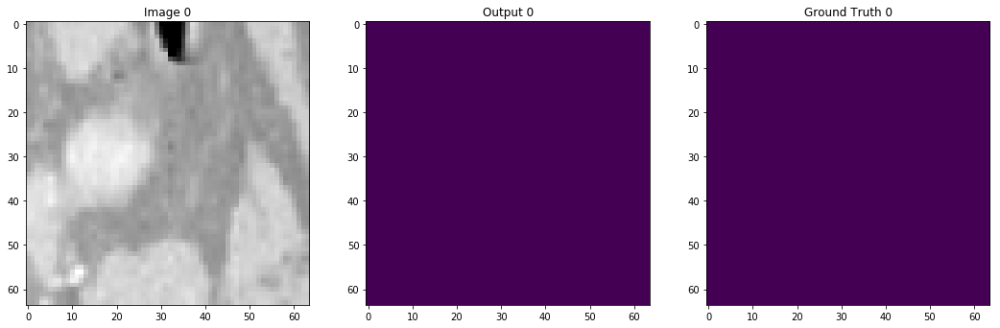

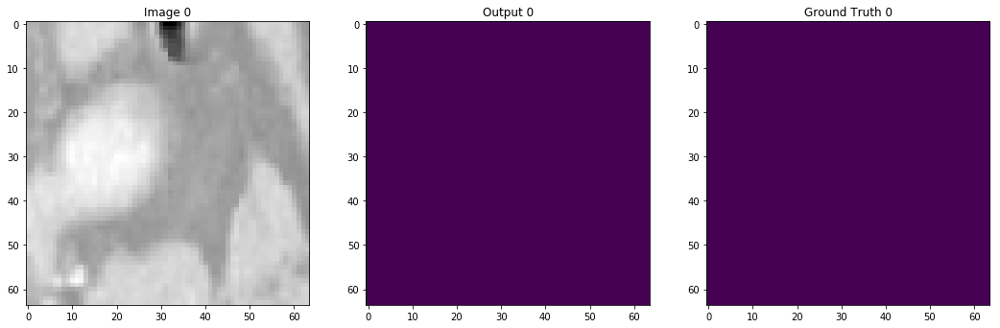

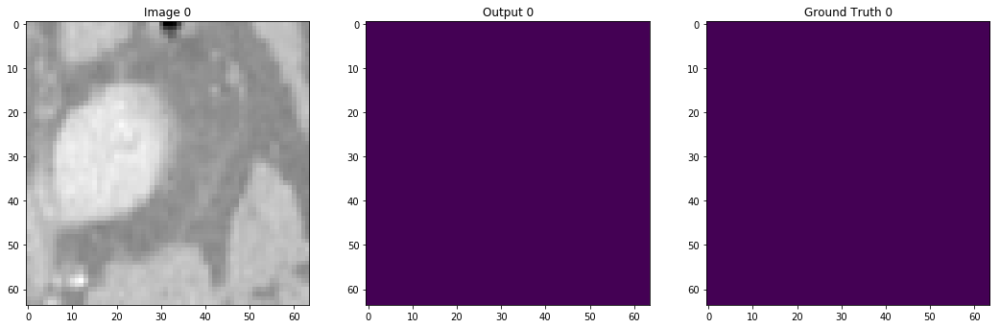

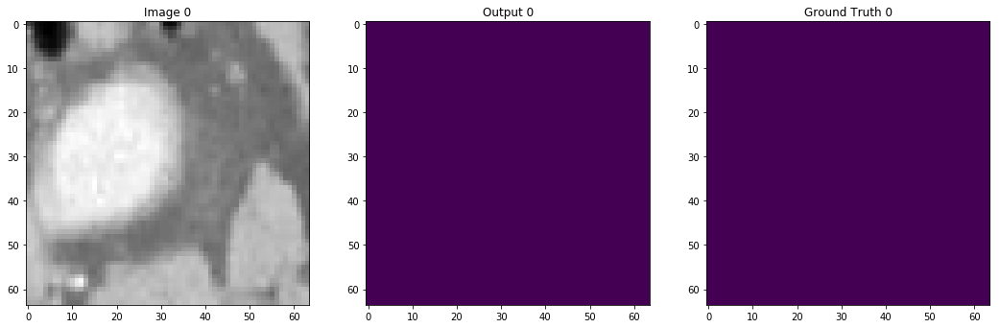

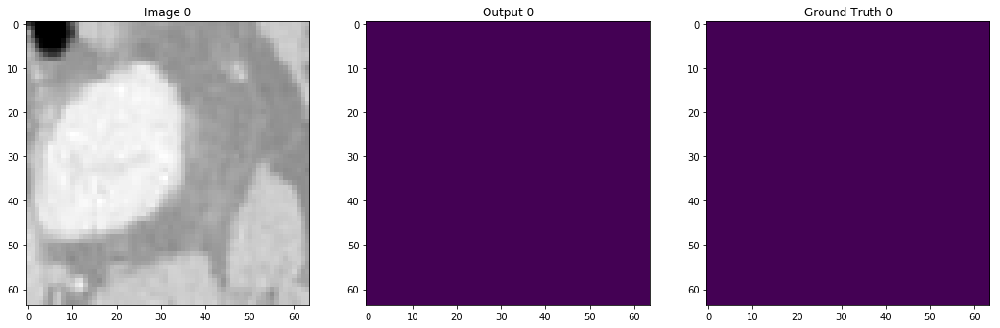

...

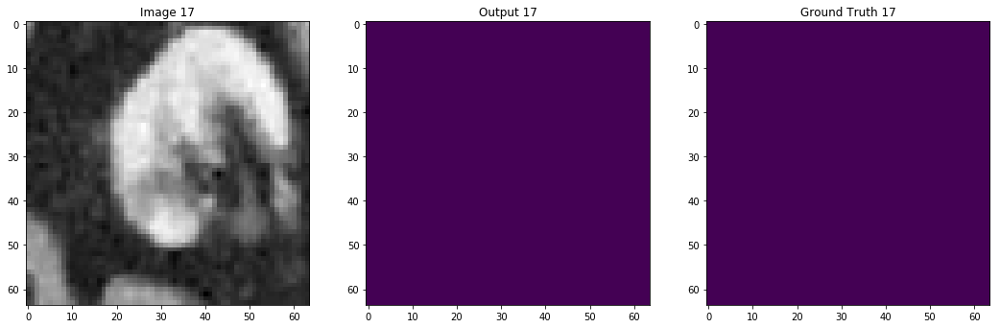

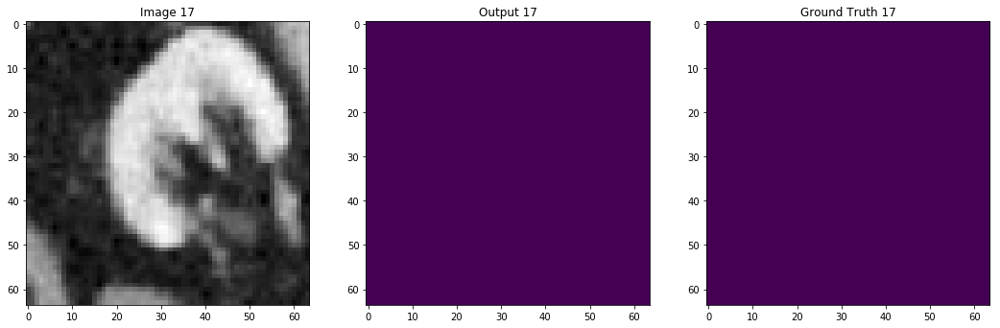

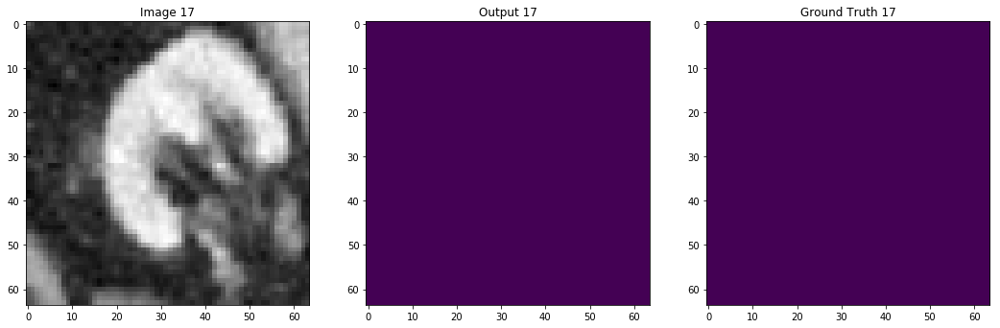

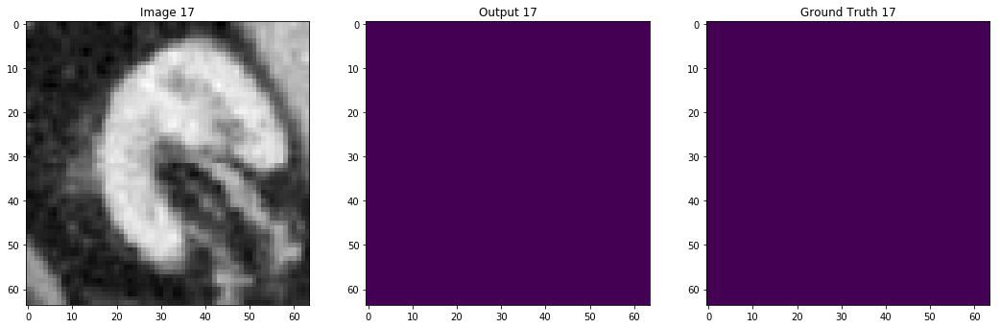

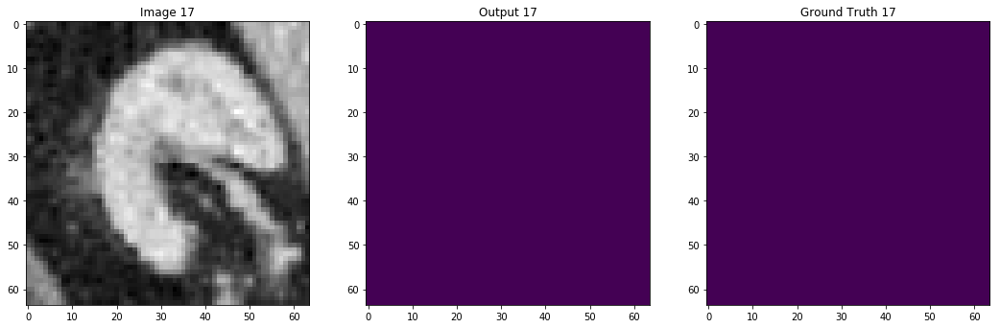

In [25]:
import torch
import os
import matplotlib.pyplot as plt
import monai

# Set device to GPU if available, otherwise CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define model parameters
num_classes = 2
features = (16, 32, 64, 128, 32, 16)
dropout = 0.1 

# Initialize the student model
model = monai.networks.nets.BasicUNet(
    spatial_dims=3,
    in_channels=1,
    out_channels=num_classes,
    features=features,  
    dropout=dropout,
)

# Load the pre-trained weights
model.load_state_dict(torch.load("/projects/renal/srm-detection-main/models/weights/segmentation/srm/best_fully_supervised_srm_model_fold_5.pth"))

# Move the model to the appropriate device
model.to(device)
model.eval()

image_slices = []
mask_slices = []

with torch.no_grad():  
    for i, test_data in enumerate(test_loader):
        # Move input data to the same device as the model
        image = test_data["img"].squeeze(1).to(device)
        seg = test_data["seg"].squeeze(1).to(device)
        
        # Perform inference
        test_outputs = model(image)
        
        for j in range(16):
            plt.figure("check", (18, 6))
            
            # Plot image slice
            plt.subplot(1, 3, 1)
            plt.title(f"Image {i}")
            plt.imshow(image[0, 0, :, :, j].cpu().numpy(), cmap="gray")
            
            # Plot model output slice
            plt.subplot(1, 3, 2)
            plt.title(f"Output {i}")
            plt.imshow(torch.argmax(test_outputs, dim=1).cpu().numpy()[0, :, :, j])
            
            # Plot ground truth slice
            plt.subplot(1, 3, 3)
            plt.title(f"Ground Truth {i}")
            plt.imshow(seg[0, 0, :, :, j].cpu().numpy(), cmap="viridis")
            
            plt.show()


In [18]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np
import os

def overlay_segmentation(vol, seg):
    # Scale volume to greyscale range
    vol_greyscale = (255*(vol - np.min(vol))/np.ptp(vol)).astype(int)
    # Convert volume to RGB
    vol_rgb = np.stack([vol_greyscale, vol_greyscale, vol_greyscale], axis=-1)
    # Initialize segmentation in RGB
    shp = seg.shape
    seg_rgb = np.zeros((shp[0], shp[1], shp[2], 3), dtype=int)  # Update dtype here
    # Set class to appropriate color
    seg_rgb[np.equal(seg, 1)] = [255, 0, 0]
    seg_rgb[np.equal(seg, 2)] = [0, 0, 255]
    # Get binary array for places where an ROI lives
    segbin = np.greater(seg, 0)
    repeated_segbin = np.stack((segbin, segbin, segbin), axis=-1)
    # Weighted sum where there's a value to overlay
    alpha = 0.3
    vol_overlayed = np.where(
        repeated_segbin,
        np.round(alpha*seg_rgb+(1-alpha)*vol_rgb).astype(np.uint8),
        np.round(vol_rgb).astype(np.uint8)
    )
    # Return final volume with segmentation overlay
    return vol_overlayed

def visualize_evaluation(case_id, vol, truth, pred, eva_path):
    # Color volumes according to truth and pred segmentation
    vol_truth = overlay_segmentation(vol, truth)
    vol_pred = overlay_segmentation(vol, pred)
    # Create a figure and two axes objects from matplotlib
    fig, (ax1, ax2) = plt.subplots(1, 2)
    # Initialize the two subplots (axes) with an empty 512x512 image
    data = np.zeros(vol.shape[1:3])
    ax1.set_title("Ground Truth")
    ax2.set_title("Prediction")
    img1 = ax1.imshow(data)
    img2 = ax2.imshow(data)
    # Update function for both images to show the slice for the current frame
    def update(i):
        plt.suptitle("Case ID: " + str(case_id) + " - " + "Slice: " + str(i))
        img1.set_data(vol_truth[i])
        img2.set_data(vol_pred[i])
        return [img1, img2]
    # Compute the animation (gif)
    interval_ms = 100  # Adjust this value to change the speed (100 ms between frames)
    fps = 10  # Adjust this value to change the speed (frames per second)
    ani = animation.FuncAnimation(fig, update, frames=len(truth), interval=interval_ms,
                                  repeat_delay=0, blit=False)
    # Set up the output path for the gif
    if not os.path.exists(eva_path):
        os.mkdir(eva_path)
    file_name = "visualization.case_" + str(case_id).zfill(5) + ".gif"
    out_path = os.path.join(eva_path, file_name)
    # Save the animation (gif)
    ani.save(out_path, writer='imagemagick', fps=fps)
    # Close the matplotlib
    plt.close()


In [28]:
# Set device to GPU if available, otherwise CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define model parameters
num_classes = 2
features = (16, 32, 64, 128, 32, 16)
dropout = 0.1 

# Initialize the student model
model = monai.networks.nets.BasicUNet(
    spatial_dims=3,
    in_channels=1,
    out_channels=num_classes,
    features=features,  
    dropout=dropout,
)

# Load the pre-trained weights
model.load_state_dict(torch.load("/projects/renal/srm-detection-main/models/weights/segmentation/srm/best_fully_supervised_srm_model_fold_5.pth"))

# Move the model to the appropriate device
model.to(device)
model.eval()
# Call the model for inference
for i, test_data in enumerate(test_loader):
        # Move input data to the same device as the model
        image = test_data["img"].squeeze(1).to(device)
        seg = test_data["seg"].squeeze(1).to(device)
        
        # Perform inference
        test_outputs = model(image)
    
        if i == 1:
            break

# Initialize empty arrays to store image and mask slices
image_slices = []
mask_slices = []
gt_slices = []

# Iterate over slices and append to lists
for slice_idx in range(32):  # Assuming 34 slices based on the size of the test output
    image_slice = image[0, 0, :, :, slice_idx].cpu().numpy()
    gt_slice = seg[0, 0, :, :, slice_idx].cpu().numpy()
    mask_slice = torch.argmax(test_outputs, dim=1).detach().cpu()[0, :, :, slice_idx].cpu().numpy()

    image_slices.append(image_slice)
    gt_slices.append(gt_slice)
    mask_slices.append(mask_slice)

# Convert lists to numpy arrays
image_volume = np.array(image_slices)
gt_volume = np.array(gt_slices)
mask_volume = np.array(mask_slices)

# Call visualize_evaluation to save the GIF
case_id = 1  # Assuming case_id is 1 for example
eva_path = "/projects/renal/srm-detection-main/outputs/segmentation/gifs_srm"  # Output path for GIF
visualize_evaluation(case_id, image_volume, gt_volume, mask_volume, eva_path)

BasicUNet features: (16, 32, 64, 128, 32, 16).


In [31]:
import torch
import os
import matplotlib.pyplot as plt
import monai
import nrrd  # Install using pip install pynrrd

# Set device to GPU if available, otherwise CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define model parameters
num_classes = 2
features = (16, 32, 64, 128, 32, 16)
student_dropout = 0.1 

# Initialize the student model
model = monai.networks.nets.BasicUNet(
    spatial_dims=3,
    in_channels=1,
    out_channels=num_classes,
    features=features,  
    dropout=student_dropout,
)

# Load the pre-trained weights
model.load_state_dict(torch.load("/projects/renal/srm-detection-main/models/weights/segmentation/srm/best_fully_supervised_srm_model_fold_5.pth"))

# Move the model to the appropriate device
model.to(device)
model.eval()

with torch.no_grad():  
    for i, test_data in enumerate(test_loader):
        # Move input data to the same device as the model
        image = test_data["img"].squeeze(1).to(device)
        seg = test_data["seg"].squeeze(1).to(device)
        
        # Perform inference
        test_outputs = model(image)
        prediction = torch.argmax(test_outputs, dim=1).cpu().numpy()
        
        # Move data back to CPU for saving
        image_np = image.cpu().numpy()
        seg_np = seg.cpu().numpy()
        
        # Save the image, prediction, and ground truth
        base_filename = f"patient_{i}"
        image_filename = os.path.join("/projects/renal/srm-detection-main/outputs/segmentation/srm_predictions", f"{base_filename}_img.nrrd")
        prediction_filename = os.path.join("/projects/renal/srm-detection-main/outputs/segmentation/srm_predictions", f"{base_filename}_pred.seg.nrrd")
        ground_truth_filename = os.path.join("/projects/renal/srm-detection-main/outputs/segmentation/srm_predictions", f"{base_filename}_gt.seg.nrrd")
        
        nrrd.write(image_filename, image_np[0])  # Save image
        nrrd.write(prediction_filename, prediction[0])  # Save prediction
        nrrd.write(ground_truth_filename, seg_np[0])  # Save ground truth
        
        print(f"Saved: {image_filename}, {prediction_filename}, {ground_truth_filename}")



BasicUNet features: (16, 32, 64, 128, 32, 16).
Saved: /projects/renal/srm-detection-main/outputs/segmentation/srm_predictions/patient_0_img.nrrd, /projects/renal/srm-detection-main/outputs/segmentation/srm_predictions/patient_0_pred.seg.nrrd, /projects/renal/srm-detection-main/outputs/segmentation/srm_predictions/patient_0_gt.seg.nrrd
Saved: /projects/renal/srm-detection-main/outputs/segmentation/srm_predictions/patient_1_img.nrrd, /projects/renal/srm-detection-main/outputs/segmentation/srm_predictions/patient_1_pred.seg.nrrd, /projects/renal/srm-detection-main/outputs/segmentation/srm_predictions/patient_1_gt.seg.nrrd
Saved: /projects/renal/srm-detection-main/outputs/segmentation/srm_predictions/patient_2_img.nrrd, /projects/renal/srm-detection-main/outputs/segmentation/srm_predictions/patient_2_pred.seg.nrrd, /projects/renal/srm-detection-main/outputs/segmentation/srm_predictions/patient_2_gt.seg.nrrd
Saved: /projects/renal/srm-detection-main/outputs/segmentation/srm_predictions/pati

### SS

BasicUNet features: (16, 32, 64, 128, 32, 16).


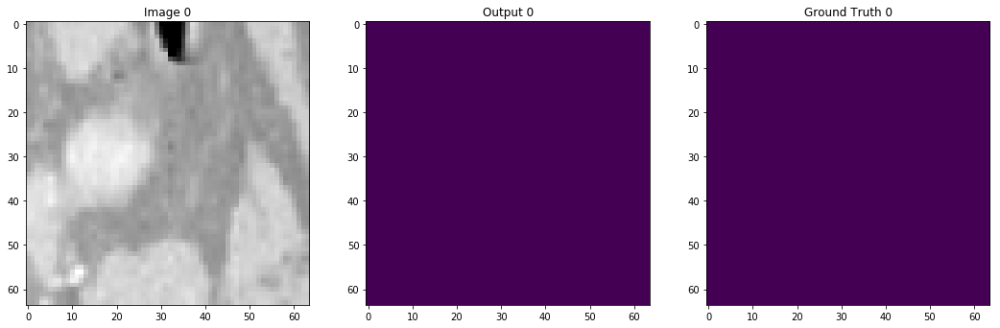

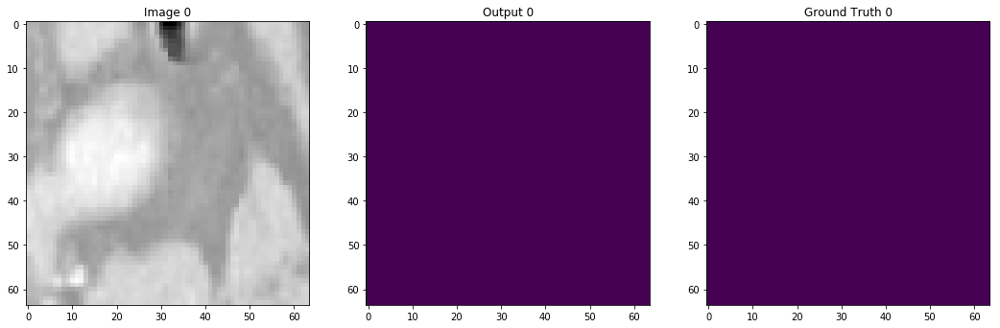

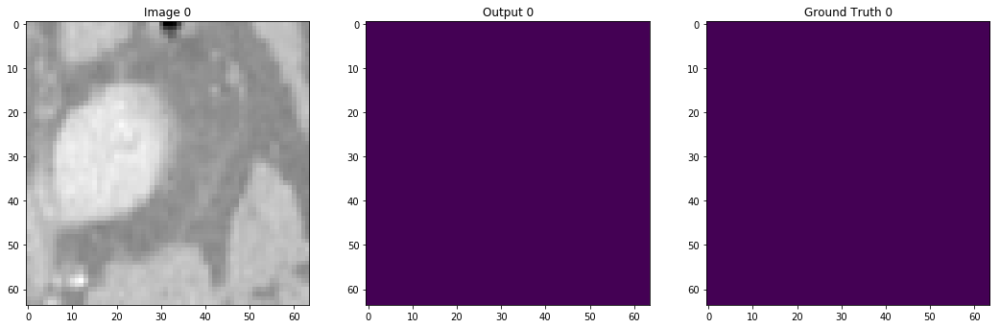

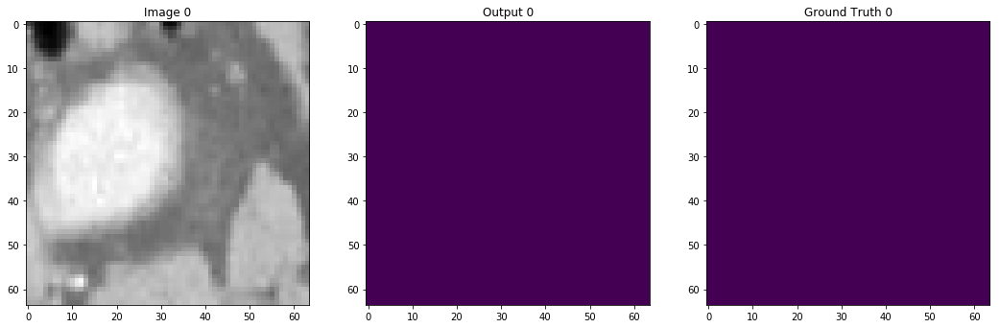

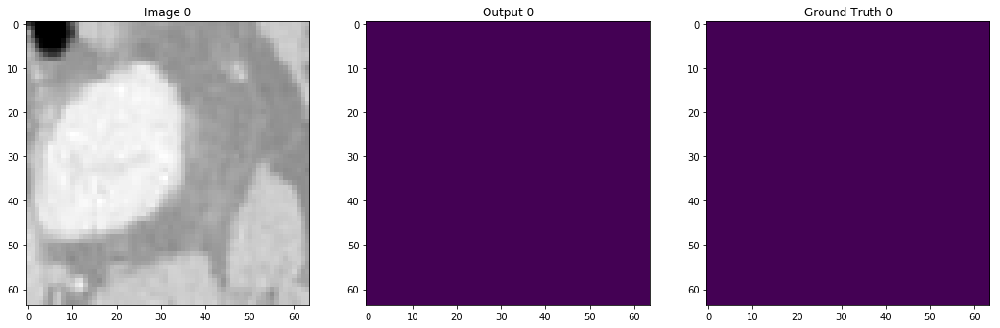

...

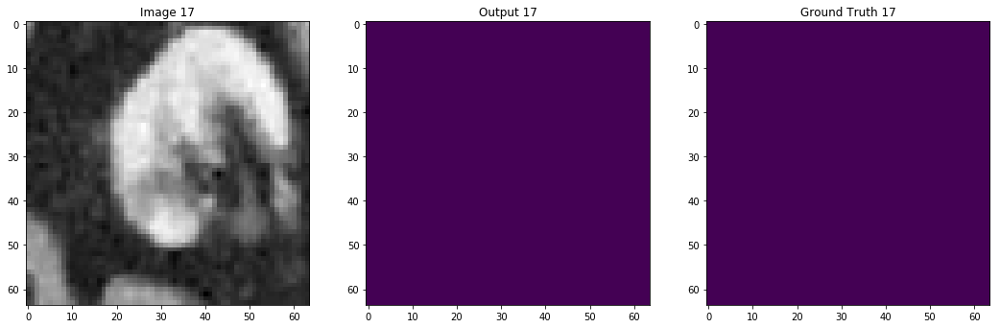

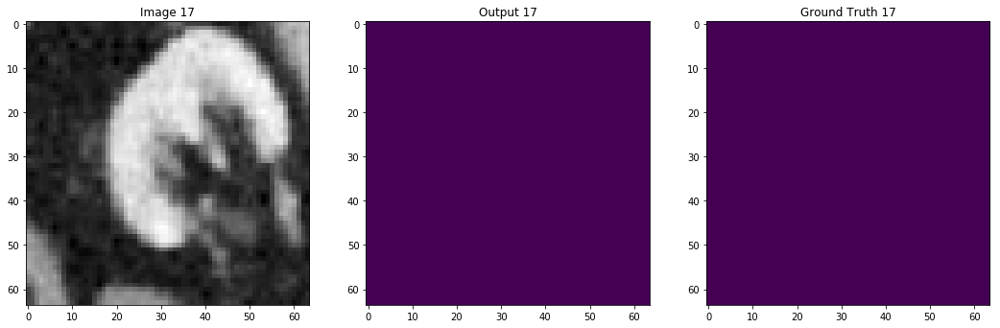

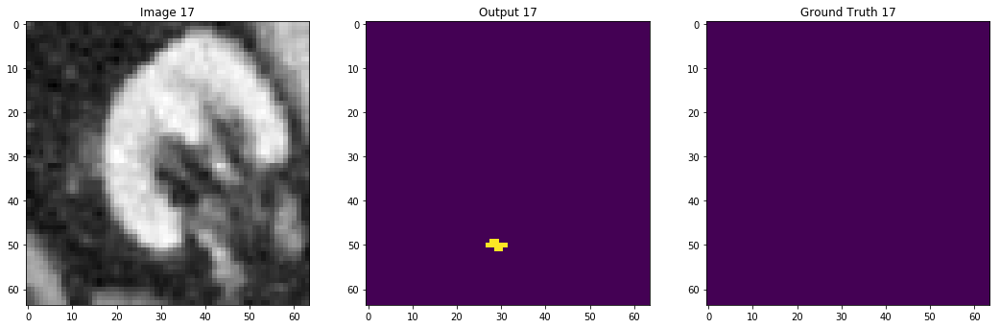

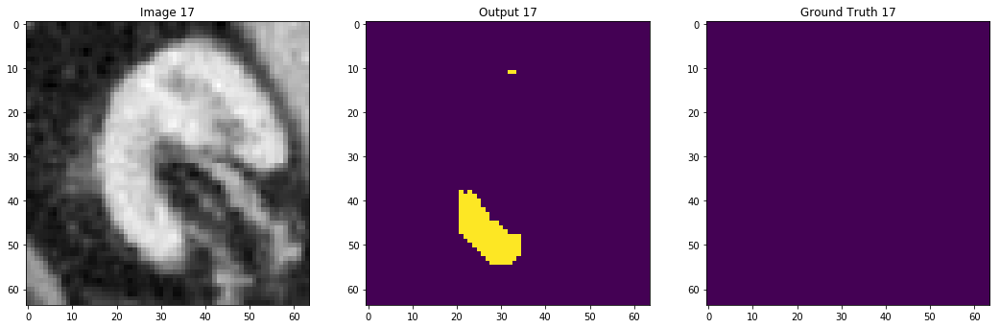

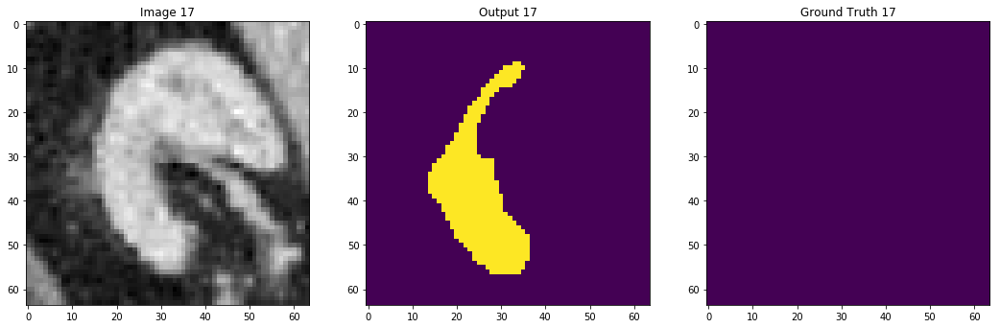

In [26]:
import torch
import os
import matplotlib.pyplot as plt
import monai

# Set device to GPU if available, otherwise CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define model parameters
num_classes = 2
features = (16, 32, 64, 128, 32, 16)
dropout = 0.1 

# Initialize the student model
model = monai.networks.nets.BasicUNet(
    spatial_dims=3,
    in_channels=1,
    out_channels=num_classes,
    features=features,  
    dropout=dropout,
)

model_path =  "/projects/renal/srm-detection-main/models/weights/segmentation/srm/best_fully_supervised_srm_model_128.pth"
# Load the pre-trained weights
model.load_state_dict(torch.load(model_path))

# Move the model to the appropriate device
model.to(device)
model.eval()

image_slices = []
mask_slices = []

with torch.no_grad():  
    for i, test_data in enumerate(test_loader):
        # Move input data to the same device as the model
        image = test_data["img"].squeeze(1).to(device)
        seg = test_data["seg"].squeeze(1).to(device)
        
        # Perform inference
        test_outputs = model(image)
        
        for j in range(16):
            plt.figure("check", (18, 6))
            
            # Plot image slice
            plt.subplot(1, 3, 1)
            plt.title(f"Image {i}")
            plt.imshow(image[0, 0, :, :, j].cpu().numpy(), cmap="gray")
            
            # Plot model output slice
            plt.subplot(1, 3, 2)
            plt.title(f"Output {i}")
            plt.imshow(torch.argmax(test_outputs, dim=1).cpu().numpy()[0, :, :, j])
            
            # Plot ground truth slice
            plt.subplot(1, 3, 3)
            plt.title(f"Ground Truth {i}")
            plt.imshow(seg[0, 0, :, :, j].cpu().numpy(), cmap="viridis")
            
            plt.show()


BasicUNet features: (16, 32, 64, 128, 32, 16).


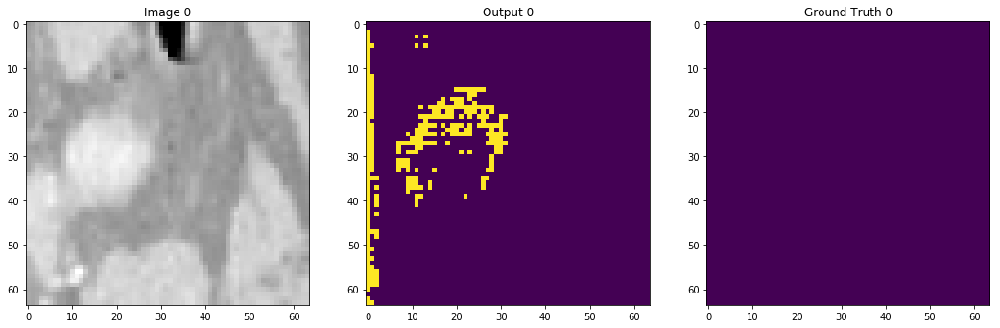

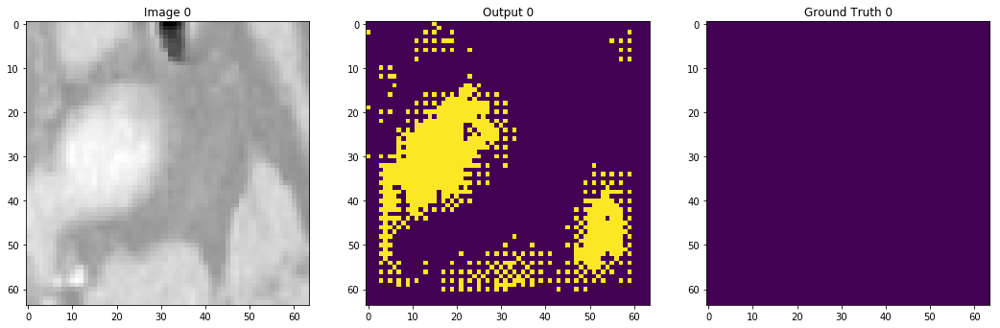

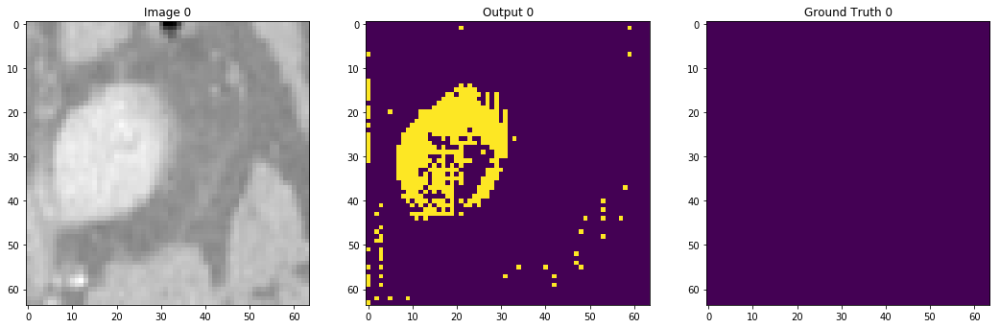

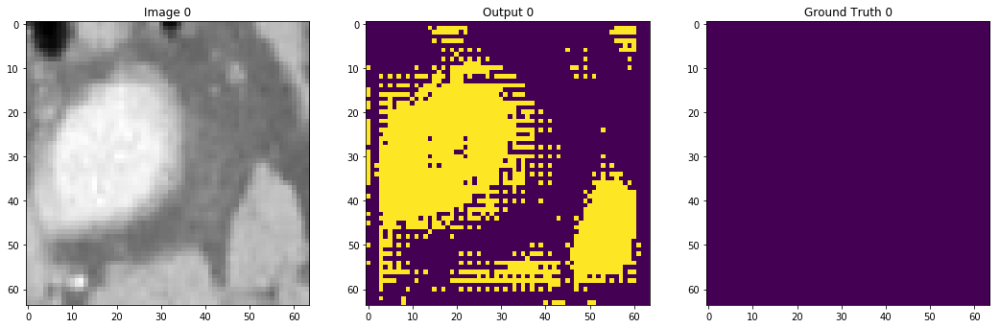

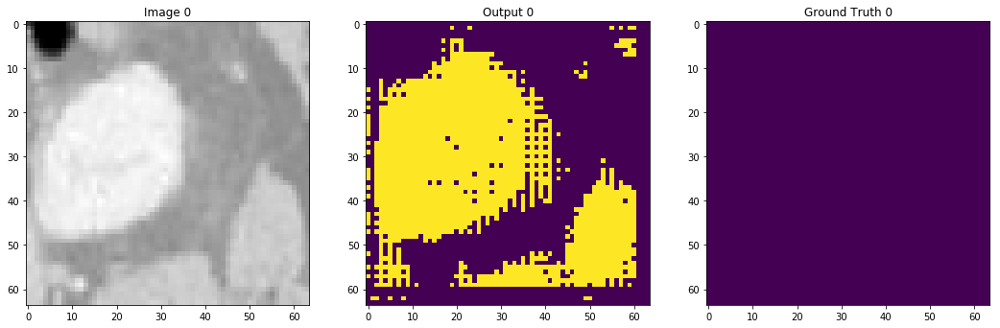

...

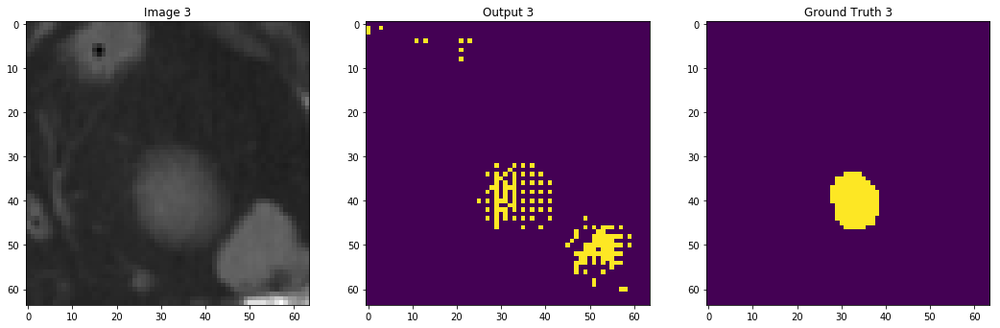

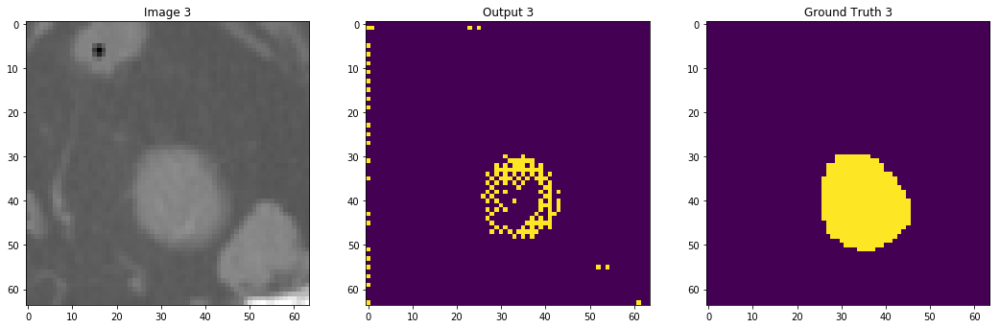

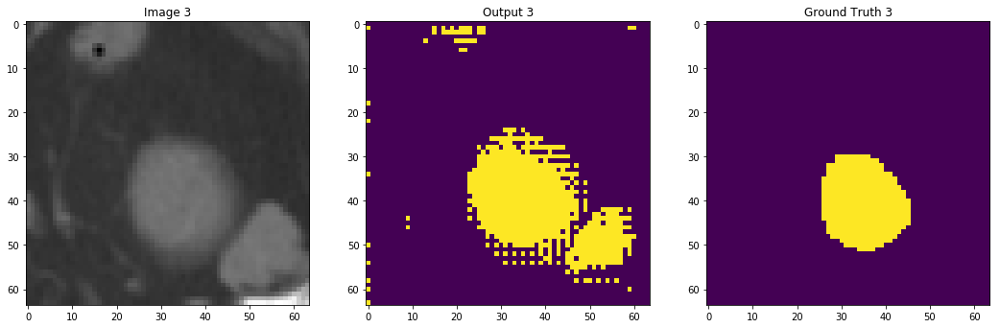

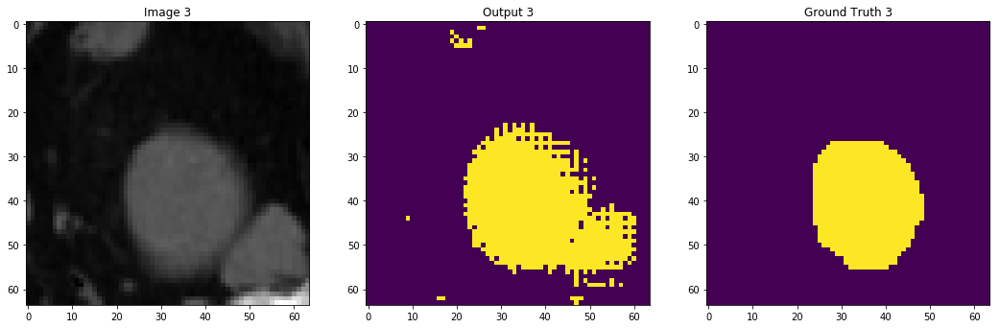

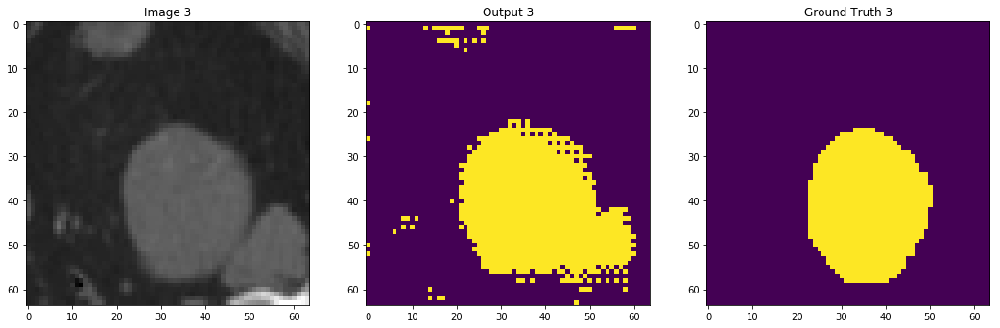

KeyboardInterrupt: 

In [27]:
import torch
import os
import matplotlib.pyplot as plt
import monai

# Set device to GPU if available, otherwise CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define model parameters
num_classes = 2
features = (16, 32, 64, 128, 32, 16)
dropout = 0.1 

# Initialize the student model
model = monai.networks.nets.BasicUNet(
    spatial_dims=3,
    in_channels=1,
    out_channels=num_classes,
    features=features,  
    dropout=dropout,
)

model_path =  "/projects/renal/srm-detection-main/models/weights/segmentation/srm/best_semi_supervised_unet_srm_model.pth"
# Load the pre-trained weights
model.load_state_dict(torch.load(model_path))

# Move the model to the appropriate device
model.to(device)
model.eval()

image_slices = []
mask_slices = []

with torch.no_grad():  
    for i, test_data in enumerate(test_loader):
        # Move input data to the same device as the model
        image = test_data["img"].squeeze(1).to(device)
        seg = test_data["seg"].squeeze(1).to(device)
        
        # Perform inference
        test_outputs = model(image)
        
        for j in range(16):
            plt.figure("check", (18, 6))
            
            # Plot image slice
            plt.subplot(1, 3, 1)
            plt.title(f"Image {i}")
            plt.imshow(image[0, 0, :, :, j].cpu().numpy(), cmap="gray")
            
            # Plot model output slice
            plt.subplot(1, 3, 2)
            plt.title(f"Output {i}")
            plt.imshow(torch.argmax(test_outputs, dim=1).cpu().numpy()[0, :, :, j])
            
            # Plot ground truth slice
            plt.subplot(1, 3, 3)
            plt.title(f"Ground Truth {i}")
            plt.imshow(seg[0, 0, :, :, j].cpu().numpy(), cmap="viridis")
            
            plt.show()
